In [2]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt
import csv
import time
import glob
from google.cloud import bigquery
import statsmodels.api as sm
from sklearn.model_selection import KFold
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import recall_score, f1_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.decomposition import PCA as sklearnPCA
from pandas.plotting import parallel_coordinates
from pydotplus import graph_from_dot_data
import xgboost as xgb
from scipy import stats
import graphviz
import seaborn as sns

In [18]:
files = glob.glob('./fraisdeport_*.csv')
for f in files:
    df = pd.read_csv(f, dtype = str)

In [19]:
treshhold = int(0.9*len(df))
df = df.dropna(thresh = treshhold, axis = 1).copy()
df = df.dropna(axis = 0).copy()
print(df.isna().sum())
print(df.shape)

Marge                   0
PM                      0
Frequence               0
PA                      0
nb_famille_produit      0
taux_retour             0
CA                      0
flag_carte_fid          0
nb_web_session          0
frequented_store_id     0
optin_email_cleansed    0
optin_mail              0
address_country_code    0
age                     0
tranche_age             0
seniority               0
civility                0
target                  0
dtype: int64
(333678, 18)


In [20]:
data_type_dictionnary = {
        'Marge' : float, 
        'PM' : float, 
        'Frequence' : float, 
        'PA' : float, 
        'nb_famille_produit' : int, 
        'taux_retour' : float,
        'CA' : float, 
        'flag_carte_fid' : str, 
        'nb_web_session' : str,
        'frequented_store_id' : str,
        'optin_email_cleansed' : str,
        'optin_mail' : str, 
        'address_country_code' : str, 
        'age' : int, 
        'tranche_age' : str, 
        'seniority' : str,
        'civility' : str, 
        'target' : str}

df = df.astype(data_type_dictionnary).copy()
print(df.dtypes)

Marge                   float64
PM                      float64
Frequence               float64
PA                      float64
nb_famille_produit        int64
taux_retour             float64
CA                      float64
flag_carte_fid           object
nb_web_session           object
frequented_store_id      object
optin_email_cleansed     object
optin_mail               object
address_country_code     object
age                       int64
tranche_age              object
seniority                object
civility                 object
target                   object
dtype: object


In [21]:
df = df[:50000].copy()

In [22]:
y = df['target'].reset_index()['target']
labels, values = np.unique(y,return_counts=True)
sizes = values

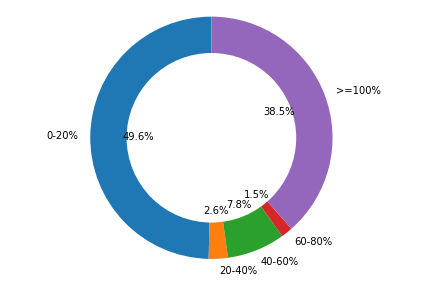

In [23]:

 
# Construction du diagramme et affichage des labels et des #fréquences en pourcentage

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)

# Tracé du cercle au milieu

centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

# Affichage du diagramme

ax1.axis('equal')  
plt.tight_layout()
plt.show()


In [24]:
cmap = plt.get_cmap('jet')

colors =cmap(np.linspace(0, 1.0, 10))


In [25]:

df_import = df.copy()

columns_encoding = df.columns[df.dtypes == object]
le = preprocessing.LabelEncoder()
df[columns_encoding] = df[columns_encoding].apply(le.fit_transform).copy()

columns_quant = df.columns[df.dtypes.astype(str).isin(['float64', 'int64'])]
df[columns_quant] = preprocessing.normalize(df[columns_quant].values)

df_y = df['target'].reset_index(drop=True).copy()
df_x = df.drop(['target'], axis = 1).reset_index(drop=True).copy()

prop_test = 0.15
X_train, X_test, y_train, y_test = train_test_split(df_x, df_y, test_size=prop_test, random_state=10)

In [26]:
cmap = plt.get_cmap('jet')
colors =cmap(np.linspace(0, 1.0, len(labels)))

<ipython-input-35-3cc7d970ca18>:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plt.scatter(lda_transformed[y==lab][0], lda_transformed[y==lab][1], lda_transformed[y==lab][2], label= lab, c=colors[i])
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/usr/local/lib/python3.9/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to sp

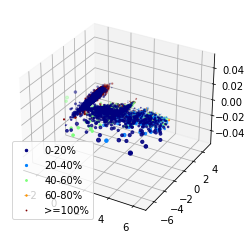

In [35]:
lda = LDA(n_components=3) #3-dimensional LDA
lda_transformed = pd.DataFrame(lda.fit_transform(df_x, y))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for i, lab in enumerate(labels):
    plt.scatter(lda_transformed[y==lab][0], lda_transformed[y==lab][1], lda_transformed[y==lab][2], label= lab, c=colors[i])

# Display legend and show plot
plt.legend(loc=3)
plt.show()

<ipython-input-33-88f385078c6e>:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


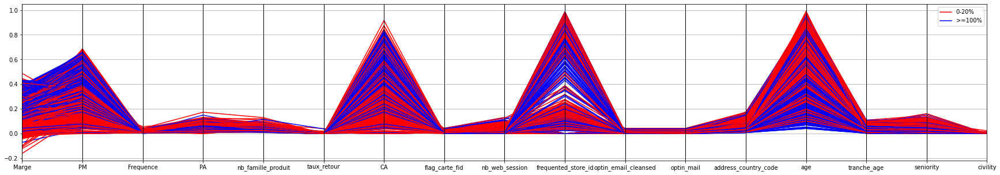

In [33]:

# Select features to include in the plot 
plot_feat = df_x.columns
y_bis = y[y.isin(['0-20%', '>=100%' ])]
x_bis = df_x.loc[y_bis.index]


data_norm = pd.concat([x_bis[plot_feat].iloc[:1000], y_bis.iloc[:1000]], axis=1)

# Perform parallel coordinate plot
fig, host = plt.subplots(figsize=(30,5))
parallel_coordinates(data_norm, 'target', color = ['red', 'blue'])

fig.show()

In [29]:
pca = sklearnPCA(n_components=2) #2-dimensional PCA
transformed = pd.DataFrame(pca.fit_transform(df_x))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

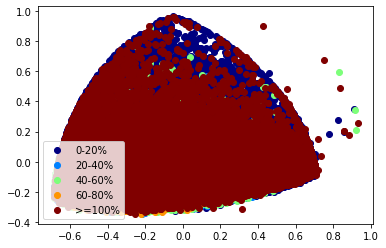

In [30]:
fig = plt.figure()
ax = fig.add_subplot(111)

for i, lab in enumerate(labels):
    plt.scatter(transformed[y==lab][0], transformed[y==lab][1], label= lab, c=colors[i])

plt.legend(loc=3)
plt.show()

In [52]:

# Create dictionnary with several dataframes : one per label
classes = df_import['target'].unique()
dict_stats_columns = {}
for cl in classes:
    dict_stats_columns[cl] = df_import[df_import['target'] == cl].describe()


In [83]:
#compute stats per label
columns_stats = dict_stats_columns['0-20%'].columns
dict_map_stats = {}
for col in columns_stats:
    stats_df = pd.DataFrame([])
    for cl in classes:
        stats_df[cl] = dict_stats_columns[cl][col]
    dict_map_stats[col] = stats_df

In [105]:
#parameters for plotting
plots = dict_map_stats.keys()
rows = np.ceil(np.sqrt(len(plots)))
col = np.ceil(np.sqrt(len(plots)))


dict_keys(['Marge', 'PM', 'Frequence', 'PA', 'nb_famille_produit', 'taux_retour', 'CA', 'age'])

<ipython-input-132-3668a944b5c9>:3: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(rows, col, i+1)


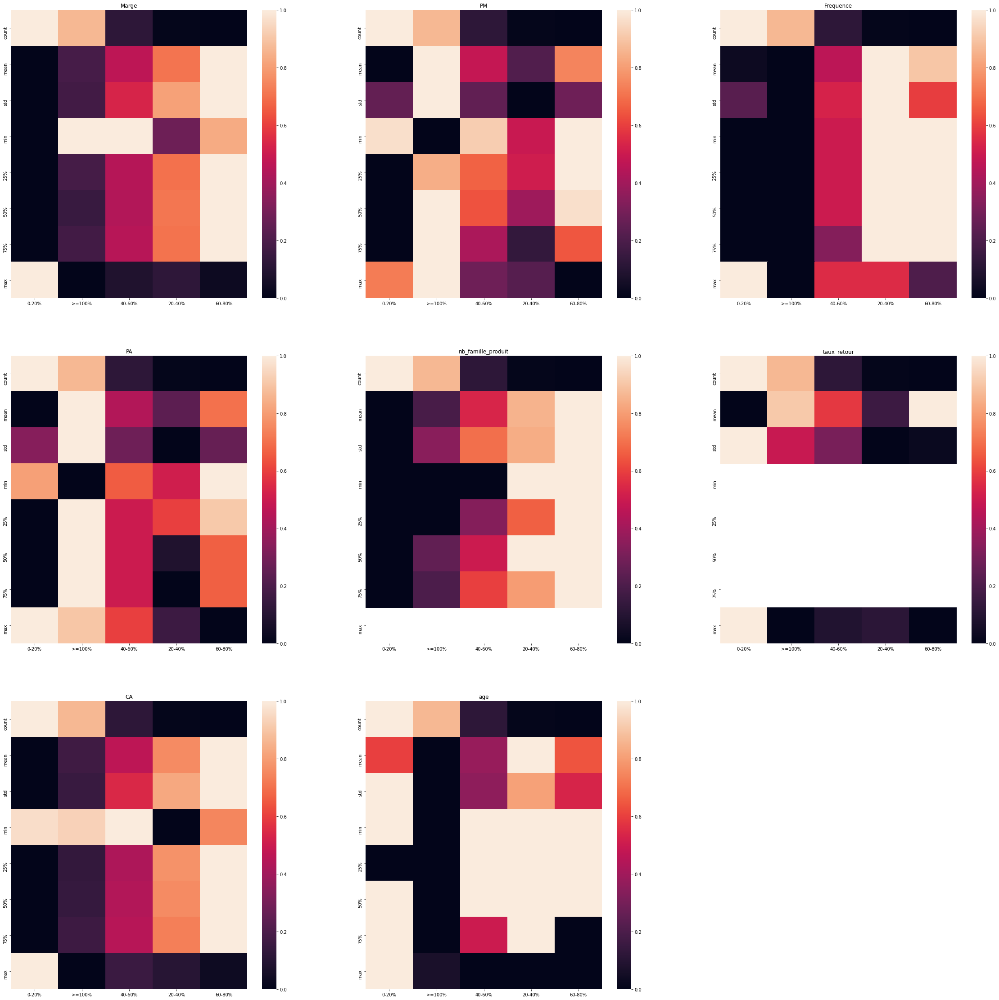

In [132]:
fig = plt.figure(figsize = (40, 40))
for i, sp in enumerate(plots):
    plt.subplot(rows, col, i+1)
    plt.title(sp)
    #normalize rows
    column_maxes = dict_map_stats[sp].max(axis = 1)
    column_mins = dict_map_stats[sp].min(axis = 1)
    plt_df = (dict_map_stats[sp].sub(column_mins, axis = 'index')).div(column_maxes.sub(column_mins, axis = 'index'), axis=0)
    #plot
    sns.heatmap(plt_df)

In [78]:
xgb_model = xgb.XGBClassifier(random_state=36, use_label_encoder=False, 
                                max_depth = 3,
                                grow_policy = 'lossguide',
                                max_bin = 6,
                                max_leaves = 6,
                                tree_metohd = 'exact')
xgb_model.fit(X_train, y_train, early_stopping_rounds=10, eval_set=[(X_test, y_test)], verbose=False)


[18:22:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:541: 
Parameters: { tree_metohd } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:22:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              grow_policy='lossguide', importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012, max_bin=6,
              max_delta_step=0, max_depth=3, max_leaves=6, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=8, num_parallel_tree=1, objective='multi:softprob',
              random_state=36, reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', tree_metohd='exact',
              use_label_encoder=False, ...)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

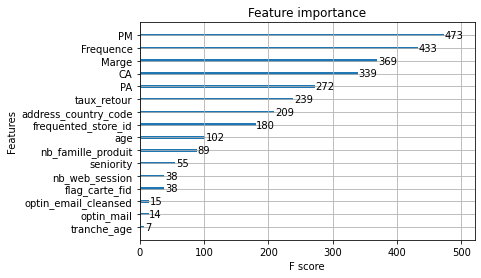

In [79]:
xgb.plot_importance(xgb_model)
#xgb.to_graphviz(xgb_model, num_trees=xgb_model.best_iteration)


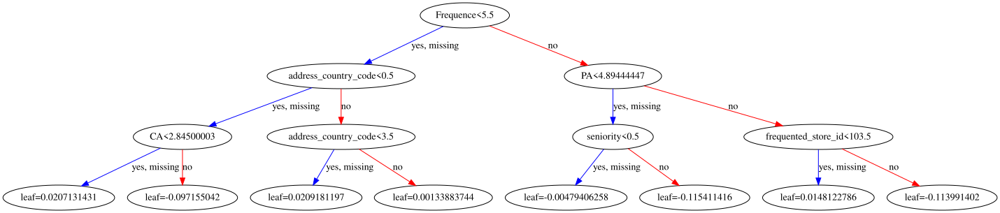

In [80]:
xgb.to_graphviz(xgb_model, num_trees=xgb_model.best_iteration)


In [56]:
predictions_test_xgb = xgb_model.predict(X_test)
predictions_train_xgb = xgb_model.predict(X_train)


In [57]:
train_acc = accuracy_score(y_train, predictions_train_xgb)
print(train_acc)

test_acc = accuracy_score(y_test, predictions_test_xgb)
print(test_acc)



0.659622178502676
0.6552785103492368


In [58]:

# Calcul du recall pour XGBoost

recall = recall_score(y_test, predictions_test_xgb, average='macro')
print('Recall: %.3f' % recall)

f1 = f1_score(y_test, predictions_test_xgb, average='macro')
print('F1-Score: %.3f' % f1)

Recall: 0.547
F1-Score: 0.528
